## EDA - Hotel Churn Prediction

### Import Libraries

In [99]:
import pandas as pd
import numpy as np
import seaborn as sns
import pymongo
import json
import matplotlib.pyplot as plt
import missingno as msno
%matplotlib inline
from pandas_profiling import ProfileReport


### Import dataset

In [3]:
data = pd.read_csv("Bookings.csv")

### Data Exploration

In [18]:
# first 5 values
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [19]:
#statistical description
data.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [20]:
# detailed information of data
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [22]:
#(rows,columns)
data.shape

(119390, 32)

### Categorical values

In [23]:
data['hotel'].unique()

array(['Resort Hotel', 'City Hotel'], dtype=object)

In [24]:
data['is_canceled'].unique()

array([0, 1], dtype=int64)

In [25]:
data['arrival_date_year'].unique()

array([2015, 2016, 2017], dtype=int64)

In [29]:
data['market_segment'].unique()

array(['Direct', 'Corporate', 'Online TA', 'Offline TA/TO',
       'Complementary', 'Groups', 'Undefined', 'Aviation'], dtype=object)

In [30]:
data['distribution_channel'].unique()

array(['Direct', 'Corporate', 'TA/TO', 'Undefined', 'GDS'], dtype=object)

In [33]:
data['reserved_room_type'].unique()

array(['C', 'A', 'D', 'E', 'G', 'F', 'H', 'L', 'P', 'B'], dtype=object)

In [34]:
data['assigned_room_type'].unique()

array(['C', 'A', 'D', 'E', 'G', 'F', 'I', 'B', 'H', 'P', 'L', 'K'],
      dtype=object)

In [35]:
data['deposit_type'].unique()

array(['No Deposit', 'Refundable', 'Non Refund'], dtype=object)

In [38]:
data['customer_type'].unique()

array(['Transient', 'Contract', 'Transient-Party', 'Group'], dtype=object)

In [39]:
data['required_car_parking_spaces'].unique()

array([0, 1, 2, 8, 3], dtype=int64)

In [40]:
data['reservation_status'].unique()

array(['Check-Out', 'Canceled', 'No-Show'], dtype=object)

### Find Missing values

In [42]:
data.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

### Handling Missing Values

In [46]:
# company  attributes having 112593 missing values means almost all values; so dropping this column
data.drop('company', axis = 1, inplace = True)

In [50]:
# agent  having 16340 missing values; may be the customers booked hotel without the help of agent 
# so we can replace null values using 0  (agent id)
# children having 4 null values ; may be there is no child; so replace this also with 0 value

data[['children','agent']] = data[['children','agent']].fillna(0)


In [54]:
# country having 488 missing values; replacing with mode value of country

data['country'] = data['country'].fillna(data['country'].mode()[0])

In [55]:
data.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces 

In [62]:
# Deleting unnecessary rows


In [64]:
data.drop(data[(data['stays_in_weekend_nights']+data['stays_in_week_nights'])==0].index , inplace = True)

In [70]:
data.drop(data[(data['adults']+ data['children'] + data['babies'])==0].index, inplace = True)

In [72]:
data.drop(data[data['adr']==0].index,inplace = True)

In [74]:
data.shape

(117400, 31)

### Data Visualization

<AxesSubplot:xlabel='hotel', ylabel='count'>

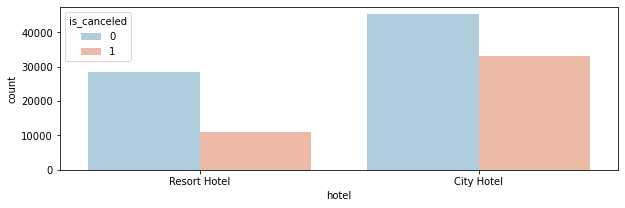

In [129]:
plt.figure(figsize = (10, 3))
sns.countplot(data = data, x = 'hotel',hue = 'is_canceled',palette='RdBu_r')

In [169]:
discrete_feature = [feature for feature in data if len(data[feature].unique())<=5]
print(discrete_feature)

['hotel', 'is_canceled', 'arrival_date_year', 'adults', 'children', 'babies', 'meal', 'distribution_channel', 'is_repeated_guest', 'deposit_type', 'customer_type', 'required_car_parking_spaces', 'reservation_status']


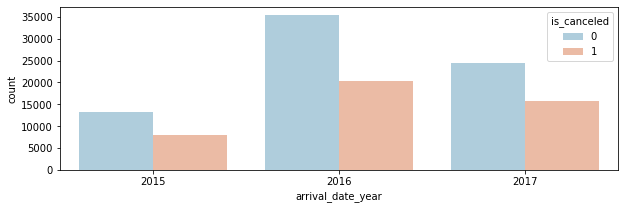

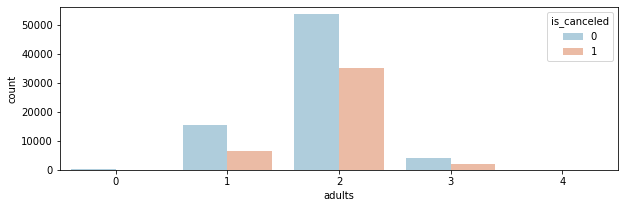

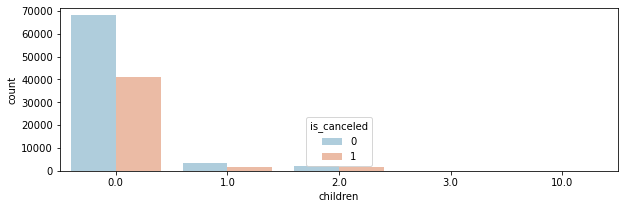

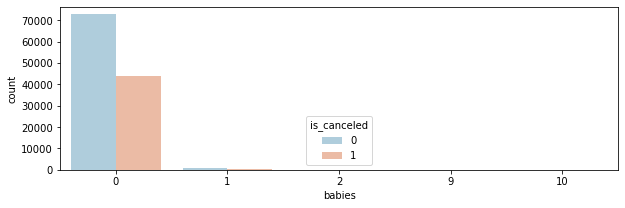

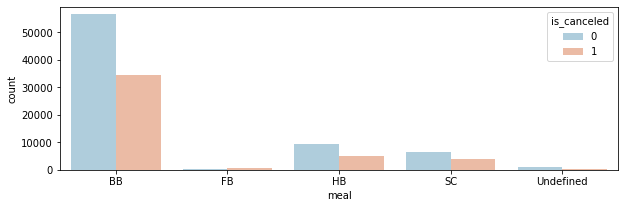

...

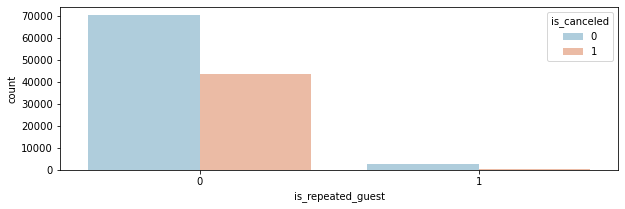

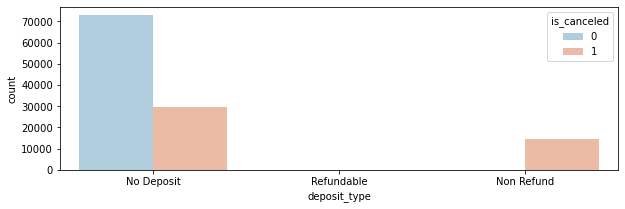

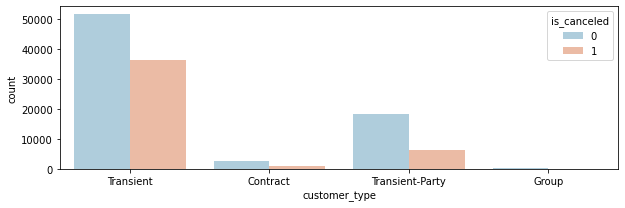

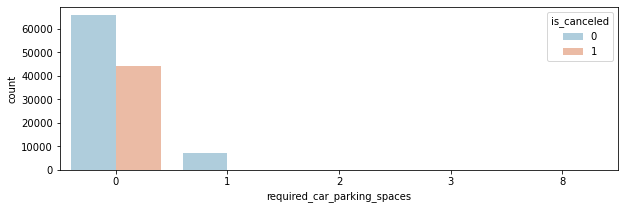

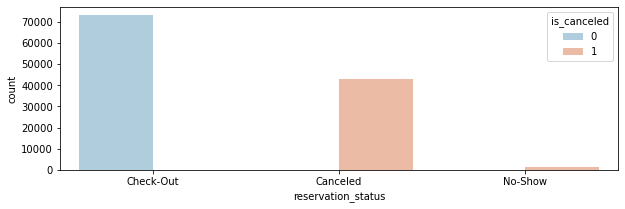

In [170]:
for plot in discrete_feature[2:]:
    plt.figure(figsize = (10, 3))
    sns.countplot(data = data, x = plot,hue = 'is_canceled',palette= 'RdBu_r')

In [131]:
ordered_months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
data['arrival_date_month'] = pd.Categorical(data['arrival_date_month'], categories=ordered_months, ordered=True)

<AxesSubplot:xlabel='arrival_date_month', ylabel='count'>

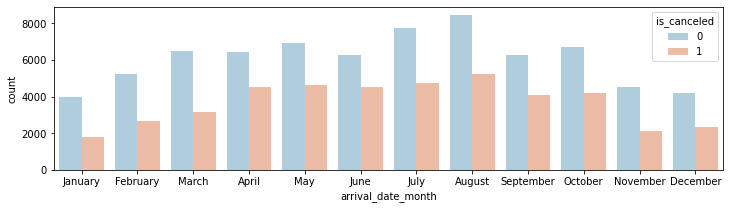

In [137]:
plt.figure(figsize = (12, 3))
sns.countplot(data = data, x = 'arrival_date_month',hue = 'is_canceled',palette= 'RdBu_r')

<AxesSubplot:xlabel='country', ylabel='count'>

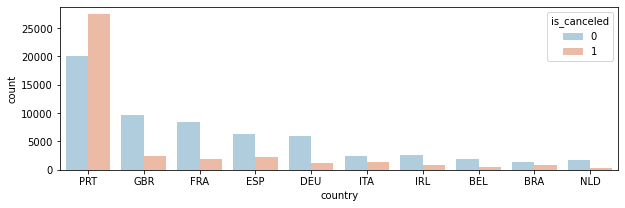

In [136]:
plt.figure(figsize = (10, 3))
sns.countplot(data = data, x = 'country',hue = 'is_canceled',order=pd.value_counts(data['country']).iloc[:10].index,palette= 'RdBu_r')

<AxesSubplot:xlabel='market_segment', ylabel='count'>

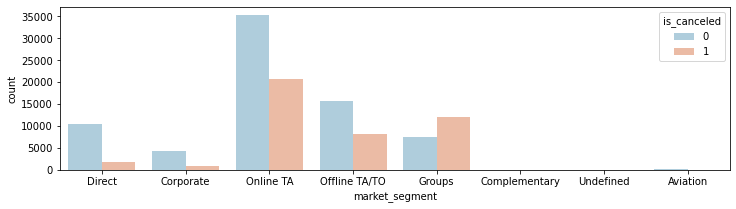

In [138]:
plt.figure(figsize = (12, 3))
sns.countplot(data = data, x = 'market_segment',hue = 'is_canceled',palette= 'RdBu_r')

<AxesSubplot:xlabel='days_in_waiting_list', ylabel='count'>

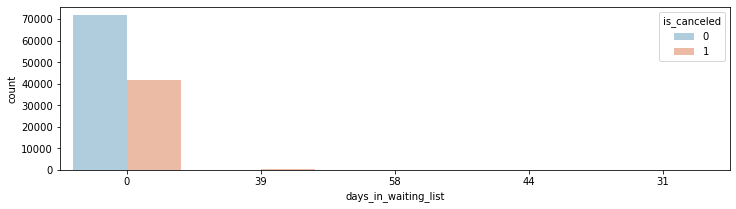

In [147]:
plt.figure(figsize = (12, 3))
sns.countplot(data = data, x = 'days_in_waiting_list',hue = 'is_canceled',order=pd.value_counts(data['days_in_waiting_list']).iloc[:5].index,palette= 'RdBu_r')

<AxesSubplot:xlabel='arrival_date_month', ylabel='adr'>

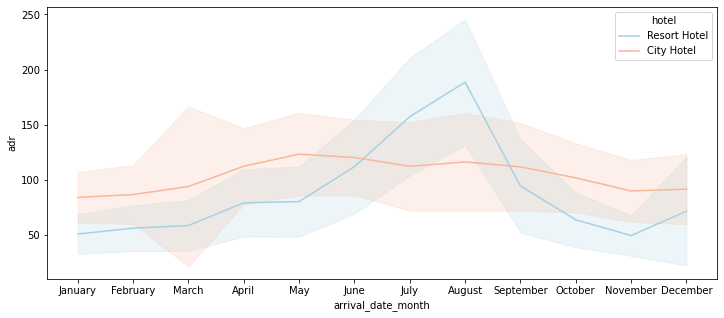

In [123]:
plt.figure(figsize = (12, 5))

sns.lineplot(x = 'arrival_date_month', y = 'adr', hue = 'hotel', data = data, palette='RdBu_r',ci = 'sd')

<AxesSubplot:xlabel='arrival_date_month', ylabel='is_canceled'>

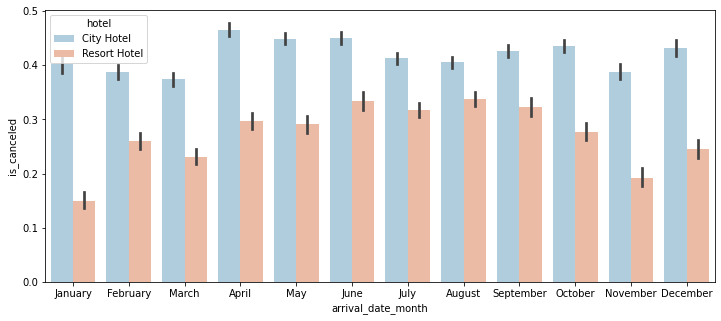

In [153]:
plt.figure(figsize = (12, 5))

sns.barplot(x = "arrival_date_month", y = "is_canceled", hue="hotel",hue_order = ["City Hotel", "Resort Hotel"],data=data,palette='RdBu_r')

In [171]:
profile = ProfileReport(data, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Findings

- City hotel has more bookings compared to resort hotel.

- More cancellations - Resort hotel

- More booking is done in the year 2016

- More cancellations on 2016

- July August having more bookings

- Country having more bookings - PRT

- More cancellation from GBR 

- More booking and cancellation from online Tour agents

- Non repeated guests have more booking and also cancellation

- No cancellataion on non refundable cases.

- More cancellation on no deposit cases

- More cancellation from Transient customers


### Correlation


- is_repeated_guest and previous_bookings_not_cancelled are highly correlated

- lead_time and is_canceled are also correlated

- arrival_date_week_number and arrival_date_year are negatively correlated.